In [ ]:
import cv2
import glob
import os
import numpy as np
from matplotlib import pyplot as plt

# Define paths
models_path = '/kaggle/input/datasss/models/'
scenes_path = '/kaggle/input/datasss/pics/'


# Load reference images
model_images = {}
for img_path in glob.glob(os.path.join(models_path, '*.png')):
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    model_images[os.path.basename(img_path)] = img

# Load scene images
scene_images = []
for img_path in glob.glob(os.path.join(scenes_path, '*.jpg')):
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    scene_images.append((os.path.basename(img_path), img))

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Function to detect and compute features
def detect_and_compute(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

# Extract features from reference images
model_keypoints_descriptors = {}
for name, img in model_images.items():
    keypoints, descriptors = detect_and_compute(img)
    model_keypoints_descriptors[name] = (img, keypoints, descriptors)

# Extract features from scene images
scene_keypoints_descriptors = []
for name, img in scene_images:
    keypoints, descriptors = detect_and_compute(img)
    scene_keypoints_descriptors.append((name, img, keypoints, descriptors))




In [ ]:
# Function to draw bounding boxes
def draw_bounding_boxes(image, detections):
    for det in detections:
        position = det["position"]
        width = det["width"]
        height = det["height"]
        top_left = (int(position[0] - height / 2), int(position[1] - width / 2))
        bottom_right = (int(position[0] + height / 2), int(position[1] + width / 2))
        cv2.rectangle(image, top_left, bottom_right, (0, 0, 255), 2)  # Red rectangle with thickness 2

# Process each scene image

def match_features(desc1, desc2, lowe_ratio=0.75):
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(desc1, desc2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < lowe_ratio * n.distance:
            good_matches.append(m)
    return good_matches


In [ ]:
def debug_print(ref, num_matches, center, width, height):
    pass
    #if ref_name in ["ref23", "ref26", "ref17"]:
        #pri
        #print(f"---{ref}---  Debugging {ref_name}:")
        #print(f"  Number of matches: {num_matches}")
        #print(f"  Center: {center}")
        #print(f"  Width: {width}")
        #print(f"  Height: {height}")

def non_maximum_suppression(detections, iou_threshold=0.5):
    if len(detections) == 0:
        return []

    # Extract positions and confidence scores
    boxes = np.array([d["position"] + [d["width"], d["height"]] for d in detections])
    scores = np.array([d["confidence"] for d in detections])
    refc = np.array([d["class"] for d in detections])


    # Calculate areas of the bounding boxes
    areas = boxes[:, 2] * boxes[:, 3]
    order = scores.argsort()[::-1]

    keep = []
    while order.size > 0:
        i = order[0]
        keep.append(detections[i])
        xx1 = np.maximum(boxes[i, 0], boxes[order[1:], 0])
        yy1 = np.maximum(boxes[i, 1], boxes[order[1:], 1])
        xx2 = np.minimum(boxes[i, 0] + boxes[i, 2], boxes[order[1:], 0] + boxes[order[1:], 2])
        yy2 = np.minimum(boxes[i, 1] + boxes[i, 3], boxes[order[1:], 1] + boxes[order[1:], 3])

        w = np.maximum(0.0, xx2 - xx1)
        h = np.maximum(0.0, yy2 - yy1)
        inter = w * h
        iou = inter / (areas[i] + areas[order[1:]] - inter)

        inds = np.where(iou <= iou_threshold)[0]
        #print("N")
        order = order[inds + 1]

    return keep


def generalized_hough_transform(model_img, model_kp, model_desc, scene_img, scene_kp, scene_desc, lowe_ratio, thr=40):
    matches = match_features(model_desc, scene_desc, lowe_ratio)
    num_matches = len(matches)
    ref_name = "a"
    if num_matches < thr:
        debug_print("**** # Not enough matches", num_matches, None, None, None)
        return None, None, None, 0  # Return 0 as confidence if matches are less than threshold

    src_pts = np.float32([model_kp[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([scene_kp[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # Use RANSAC to find a robust homography
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    if M is None:
        debug_print("****M None", num_matches, None, None, None )  # Homography is None
        return None, None, None, 0  # Return 0 as confidence if homography is None

    # Get dimensions of the model image
    h, w = model_img.shape[:2]
    pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)
    dst = cv2.perspectiveTransform(pts, M)

    # Calculate bounding box parameters
    center = np.mean(dst, axis=0).flatten()
    width = np.linalg.norm(dst[0] - dst[1])
    height = np.linalg.norm(dst[1] - dst[2])

    # Debug prints for bounding box dimensions
    debug_print("what???", num_matches, center, width, height)

    # Verification step to filter out unrealistic bounding boxes
    if (width > 1000 and height > 1000) or (width > 1200 or height > 1200):
        debug_print("Bounding box too large", num_matches, center, width, height)
        return None, None, None, 0
    if width < 250 and height < 250:
        debug_print("Bounding box too small", num_matches, center, width, height)
        return None, None, None, 0
    if width < 100 or height < 100:
        debug_print("Bounding box too small", num_matches, center, width, height)
        return None, None, None, 0
    if center[0] < 0 or center[1] < 0:
        debug_print("Bounding box center out of bounds", num_matches, center, width, height)
        return None, None, None, 0

    return center, width, height, num_matches  # Use the number of matches as the confidence score
def lets_break_it_down(scene_number=0, iou_threshold=0.2, thr=40, lowe_thr=0.75):
    results = {}
    ids = scene_number
    counter = 0


    for scene_name, scene_img, scene_kp, scene_desc in scene_keypoints_descriptors:

        if counter == ids:
            scene_results = []
            for ref_name, (ref_img, ref_kp, ref_desc) in model_keypoints_descriptors.items():
                center, width, height, conf = generalized_hough_transform(ref_img, ref_kp, ref_desc, scene_img, scene_kp, scene_desc, thr=thr, lowe_ratio=lowe_thr)

                # Debug prints for detection results
                if center is not None:

                    detection = {
                        "position": [center[0], center[1]],
                        "width": width,
                        "height": height,
                        "confidence": conf,  # Use the number of matches as the confidence score
                        "class": ref_name
                    }
                    scene_results.append(detection)

            # Apply Non-Maximum Suppression to filter overlapping detections
            final_detections = non_maximum_suppression(scene_results, iou_threshold)


            # Draw bounding boxes on the scene image
            copyim = scene_img.copy()
            draw_bounding_boxes(copyim, final_detections)


            cv2.imwrite(save_path, copyim)

            results[scene_name] = final_detections

            # Display the result using matplotlib
            plt.figure(figsize=(10, 10))
            plt.imshow(cv2.cvtColor(copyim, cv2.COLOR_BGR2RGB))
            plt.title(f"Detections in {scene_name}")
            plt.axis('off')
            plt.show()
            counter += 1
        else:
            counter += 1



    # Report results
    for scene_name, scene_results in results.items():
        print(f"Scene: {scene_name}")
        for instance in scene_results:
            output_path_t = os.path.join("/kaggle/working/out/", f"{scene_name}.txt")
            class_name = instance["class"]
            position = instance["position"]
            width = instance["width"]
            height = instance["height"]
            print(f"Product {class_name} - 1 instance(s) found:")
            print(f"  Instance 1 {{position: ({int(position[0])}, {int(position[1])}), width: {int(width)}px, height: {int(height)}px}}")
            outtxt.append(f"Product {class_name} - 1 instance(s) found:")
            outtxt.append(f"  Instance 1 {{position: ({int(position[0])}, {int(position[1])}), width: {int(width)}px, height: {int(height)}px}}")
            with open(output_path_t, 'w') as f:
                for t in outtxt:
                    f.write(t + '\n')

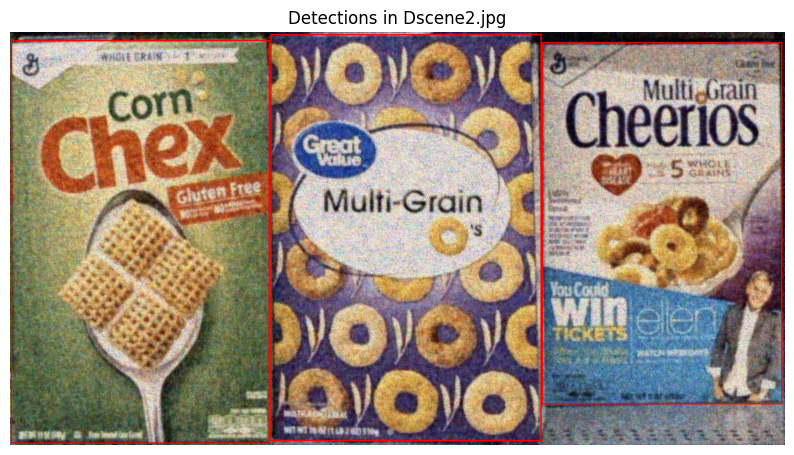

Scene: Dscene2.jpg
Product ref3.png - 1 instance(s) found:
  Instance 1 {position: (305, 493), width: 940px, height: 603px}
Product ref5.png - 1 instance(s) found:
  Instance 1 {position: (1527, 449), width: 844px, height: 560px}
Product ref4.png - 1 instance(s) found:
  Instance 1 {position: (927, 483), width: 948px, height: 632px}


In [ ]:
#Scene 2
rng1, rng2 = 20, 0.7
lets_break_it_down(scene_number=2, iou_threshold=0.3, thr=20, lowe_thr=0.7)


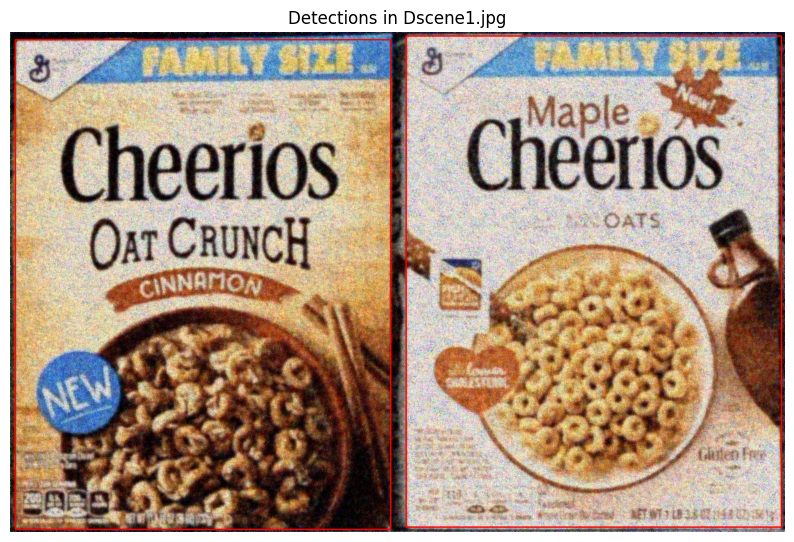

Scene: Dscene1.jpg
Product ref1.png - 1 instance(s) found:
  Instance 1 {position: (412, 539), width: 1046px, height: 802px}
Product ref2.png - 1 instance(s) found:
  Instance 1 {position: (1247, 533), width: 1049px, height: 802px}


In [ ]:
#Scene 1
lets_break_it_down(scene_number=1, iou_threshold=0.3, thr=30, lowe_thr=0.7)


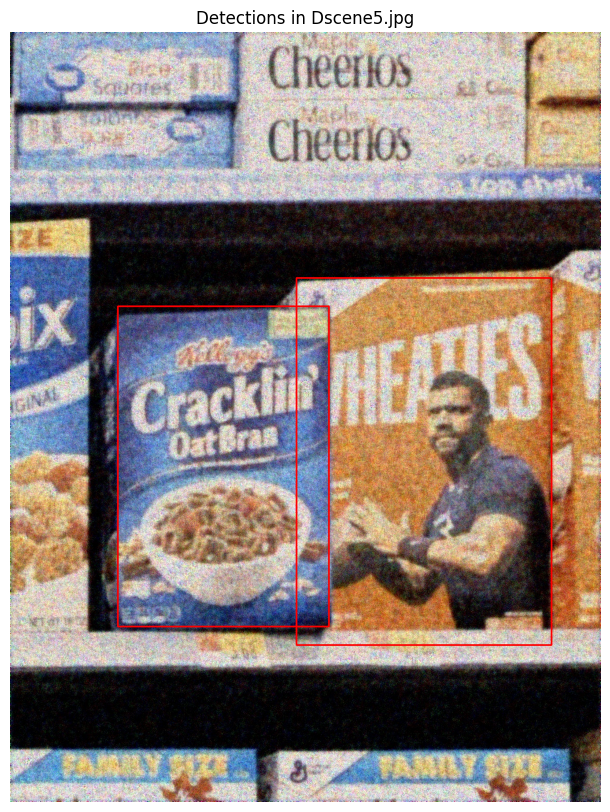

Scene: Dscene5.jpg
Product ref11.png - 1 instance(s) found:
  Instance 1 {position: (368, 751), width: 553px, height: 365px}
Product ref12.png - 1 instance(s) found:
  Instance 1 {position: (716, 743), width: 634px, height: 440px}


In [ ]:
#Scene 5
lets_break_it_down(scene_number=11, iou_threshold=0.3, thr=20, lowe_thr=0.7)


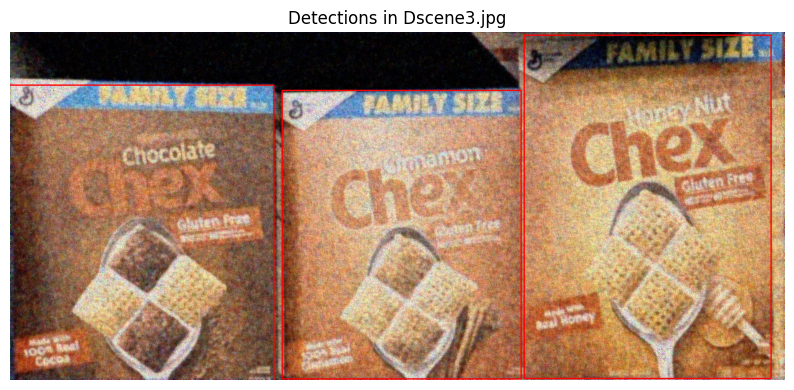

Scene: Dscene3.jpg
Product ref8.png - 1 instance(s) found:
  Instance 1 {position: (1446, 398), width: 777px, height: 560px}
Product ref6.png - 1 instance(s) found:
  Instance 1 {position: (298, 457), width: 671px, height: 601px}
Product ref7.png - 1 instance(s) found:
  Instance 1 {position: (888, 460), width: 653px, height: 541px}


In [ ]:
#Scene 3
lets_break_it_down(scene_number=7, iou_threshold=0.3, thr=20, lowe_thr=0.7)


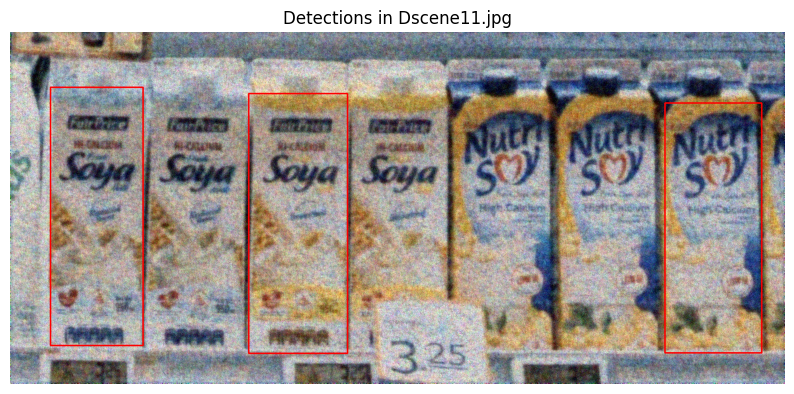

Scene: Dscene11.jpg
Product ref23.png - 1 instance(s) found:
  Instance 1 {position: (165, 353), width: 493px, height: 177px}
Product ref25.png - 1 instance(s) found:
  Instance 1 {position: (1345, 375), width: 477px, height: 185px}
Product ref24.png - 1 instance(s) found:
  Instance 1 {position: (550, 367), width: 496px, height: 189px}


In [ ]:
#Scene 11
lets_break_it_down(scene_number=8, iou_threshold=0.2, thr=17, lowe_thr=0.7)


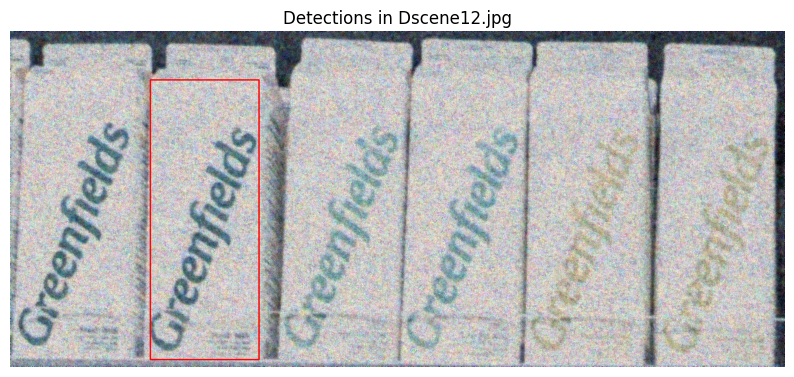

Scene: Dscene12.jpg
Product ref26.png - 1 instance(s) found:
  Instance 1 {position: (408, 395), width: 586px, height: 227px}


In [ ]:
#Scene 12
lets_break_it_down(scene_number=9, iou_threshold=0.3, thr=40, lowe_thr=0.8)


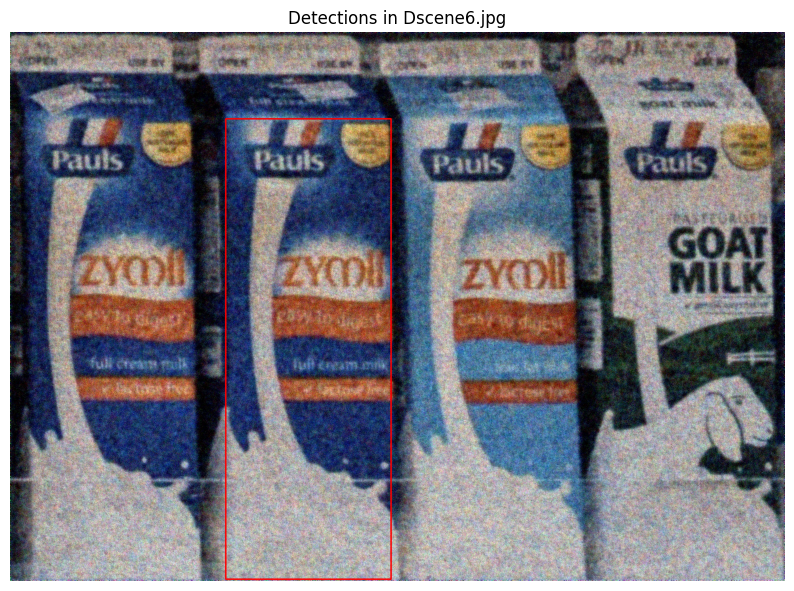

Scene: Dscene6.jpg
Product ref15.png - 1 instance(s) found:
  Instance 1 {position: (583, 618), width: 898px, height: 322px}


In [ ]:
#Scene 6
lets_break_it_down(scene_number=0, iou_threshold=0.3, thr=20, lowe_thr=0.7)


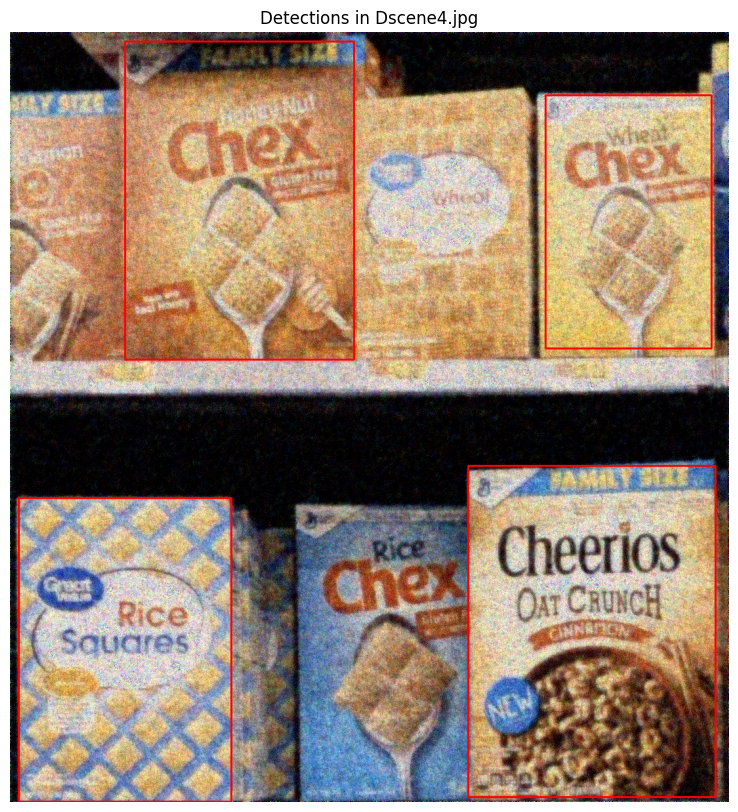

Scene: Dscene4.jpg
Product ref1.png - 1 instance(s) found:
  Instance 1 {position: (887, 913), width: 505px, height: 376px}
Product ref9.png - 1 instance(s) found:
  Instance 1 {position: (175, 941), width: 462px, height: 324px}
Product ref8.png - 1 instance(s) found:
  Instance 1 {position: (350, 257), width: 485px, height: 349px}
Product ref10.png - 1 instance(s) found:
  Instance 1 {position: (942, 289), width: 385px, height: 253px}


In [ ]:
#Scene 4
lets_break_it_down(scene_number=3, iou_threshold=0.3, thr=20, lowe_thr=0.8)


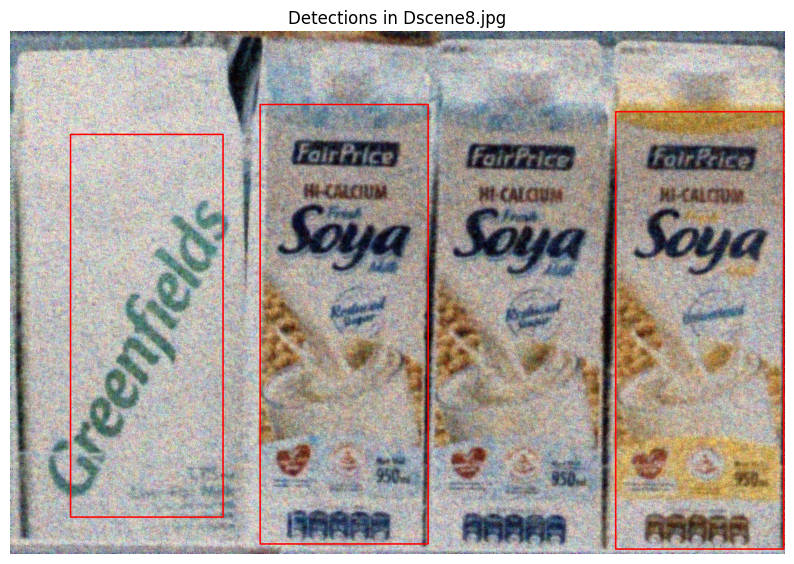

Scene: Dscene8.jpg
Product ref17.png - 1 instance(s) found:
  Instance 1 {position: (648, 568), width: 851px, height: 326px}
Product ref24.png - 1 instance(s) found:
  Instance 1 {position: (1338, 580), width: 848px, height: 325px}
Product ref26.png - 1 instance(s) found:
  Instance 1 {position: (265, 571), width: 742px, height: 295px}


In [ ]:
#Scene 8
lets_break_it_down(scene_number=4, iou_threshold=0.3, thr=30, lowe_thr=0.7)


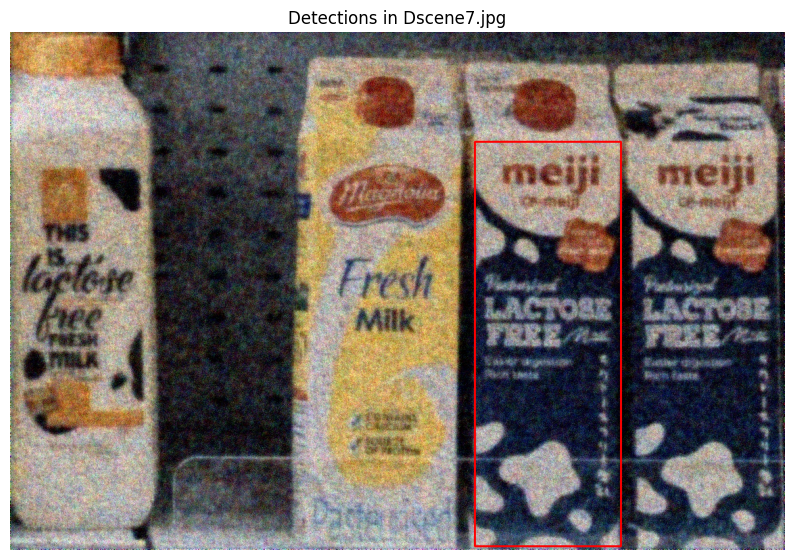

Scene: Dscene7.jpg
Product ref16.png - 1 instance(s) found:
  Instance 1 {position: (795, 461), width: 597px, height: 216px}


In [ ]:
#Scene 7
lets_break_it_down(scene_number=5, iou_threshold=0.2, thr=20, lowe_thr=0.7)


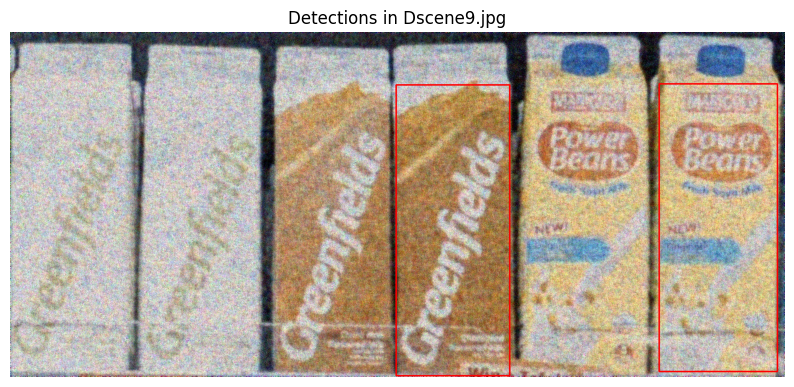

Scene: Dscene9.jpg
Product ref19.png - 1 instance(s) found:
  Instance 1 {position: (850, 380), width: 557px, height: 218px}
Product ref20.png - 1 instance(s) found:
  Instance 1 {position: (1359, 375), width: 552px, height: 226px}


In [ ]:
#Scene 9
lets_break_it_down(scene_number=6, iou_threshold=0.2, thr=20, lowe_thr=0.75)


Model ref21.png detected in scene Dscene10.jpg with confidence 45
Bounding box center: [981.62537 538.7305 ], width: 703.3685302734375, height: 248.32571411132812
Model ref22.png detected in scene Dscene10.jpg with confidence 52
Bounding box center: [1259.2996  536.162 ], width: 710.0208129882812, height: 249.77490234375


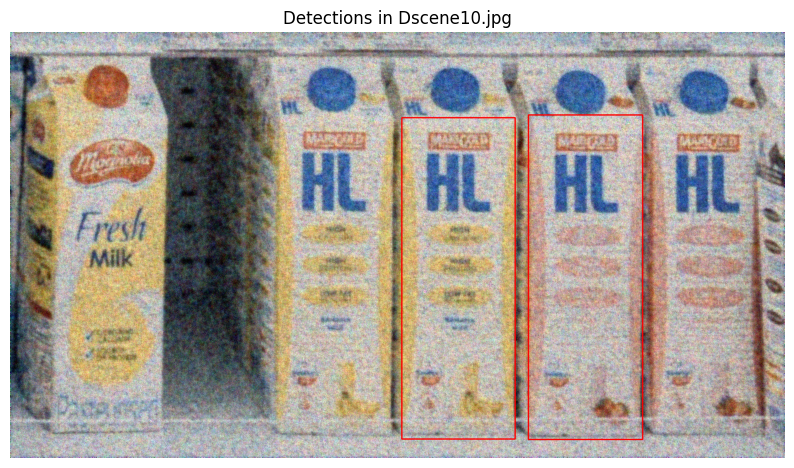

Scene: Dscene10.jpg


In [ ]:
#Scene 10
lets_break_it_down(scene_number=10, iou_threshold=0.2, thr=8, lowe_thr=0.8)